# Рынок заведений общественного питания Москвы

## Описание проекта

Наша задача в данном проекте разобраться с рынком заведений общественного питания Москвы. Проанализировать рынок и выяснить, где и какое лучше всего открыть заведение общественного питания, для этого мы проведем исследования рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

План на проект:
* Выполнить предобработку данных
* Выяснить, какие категории заведений представлены в данных и построить визуализации
* Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации
* Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете
* Выяснить, какие категории заведений чаще являются сетевыми
* Найти топ-15 популярных сетей в Москве
* Отобразить общее количество заведений и количество заведений каждой категории по районам
* Визуализироать распределение средних рейтингов по категориям заведений
* Построить фоновую картограмму со средним рейтингом заведений каждого района
* Отобразить все заведения датасета на карте
* Топ-15 улиц по количеству заведений
* Определить улицы, на которых находится только один объект общепита
* Построить хороплет для медианой цены среднего чека для каждого района
* Провести детальное исследование по открытии кофейни

**Презентация: https://drive.google.com/file/d/17lWvW5c4fc5zJxoj-A46rKIopC5HrC-V/view?usp=sharing**

## Исследование общей информации

In [1]:
# скачаем библиотеку folium, чтобы воспользоваться ей
!pip install folium

In [2]:
# Подключаем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

In [3]:
# Откроем нужный датафрейм
try:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    df = pd.read_csv('/Users/popoveg/Desktop/Analytics/Project_Public_Catering_Moscow/moscow_places.csv')

In [4]:
# Загружаем JSON-файл с границами округов Москвы
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = '/Users/popoveg/Desktop/Analytics/Project_Public_Catering_Moscow/admin_level_geomap.geojson'

In [5]:
# Установим пастельный тон для всех остальных графиков
sns.set_palette('pastel')

In [6]:
# Посмотрим на датафрейм
df.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [7]:
# Посмотрим информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Из полученного датафрейма, можно увидеть, что представлено 8406 заведений\
В датафрейме представлены столбцы: название, категория заведения, адрес, район, часы работы, широта, долгота, рейтинг, цена, средний чек, медиана среднего чека, сетевое заведение или нет, кол-во посадочных мест.

## Предобработка данных

### Проверим на дубликаты

In [8]:
df.duplicated().sum()

0

Дубликатов не было найдено

### Посмотрим на количество пропусков в столбцах

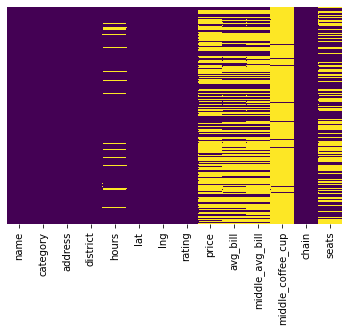

In [9]:
# Визуализируем
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.show;

In [10]:
# Посмотрим в числах
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Можем увидеть, что больше всего пропусков представлено в столбце middle_coffee_cup, middle_avg_bill, price, avg_bill, seats, hours. Причем больше всего пропусков связано с ценами, база данных неполная и заполнить нам нечем, так как пропуском слишком много. В колонках seats и hours также нам нечем заполнить их слишком много и искусвтенные данные могут исказить истинный результат

### Посмотрим на количественные данные

In [11]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Можно заметить, что в столбцах middle_avg_bill, middle_coffee_cup и seats максимальные значения, сильно выбиваются из остальных, посмотрим отдельно на данные столбцы 

### Рассмотрим и удалим аномалии в столбце middle_avg_bill

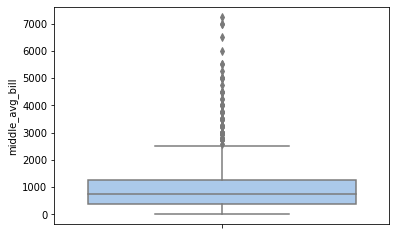

In [12]:
sns.boxplot(y='middle_avg_bill', data=df[df['middle_avg_bill'] < 9000]) # Посмтроим ящик с усами
plt.show;

In [13]:
# Посчитаем процент потерь, если удалить значения выше 2500
round(df[df['middle_avg_bill'] > 2500]['name'].count() / df[df['middle_avg_bill'] <= 2500]['name'].count(),3)*100

3.4000000000000004

In [14]:
# Посчитаем процент потерь, если удалить значения выше 4000
round(df[df['middle_avg_bill'] > 4000]['name'].count() / df[df['middle_avg_bill'] <= 4000]['name'].count(),3)*100

0.8

In [15]:
df = df.fillna(-1) #заменим пропуски на значение -1, чтобы удалить значения выше 4000 
df = df.loc[(df['middle_avg_bill'] <= 4000) | (df['middle_avg_bill'] == -1)]
df = df.replace(-1,np.nan) # вернем пропуски обратно

Из ящика с усами можем заметить, что есть выброс, который равен 35000, он сильно выделяется среди других данных, не будем учитывать его, чтобы увидеть остальные данные\
Теперь мы видим, более четкую картинку, медиана находится меньше 1000, также можем увидеть, что выбросы находятся за 2500, но их слишком много 3%, удалим только значения, которые выше 4000, это 0.7%\
Так данные будут чище

### Рассмотрим и удалим аномалии в столбце middle_coffee_cup

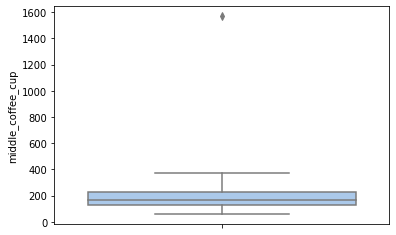

In [16]:
sns.boxplot(y='middle_coffee_cup', data=df)
plt.show;

Посмотрим, что это за кофейня, в которой кофе стоит почти 1600

In [17]:
df[df['middle_coffee_cup'] == 1568]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Похоже на опечтку со средней ценой чека, так как в других заведениях этой сети, цены гораздно ниже, удалим

In [18]:
df = df[df['middle_coffee_cup'] != 1568] # Удаляем выброс

### Рассмотрим и удалим аномалии в столбце seats

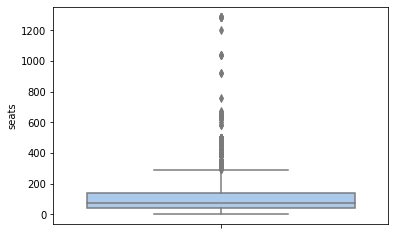

In [19]:
sns.boxplot(y='seats', data=df)
plt.show;

In [20]:
round(df[df['seats'] > 600]['name'].count() / df[df['seats'] < 600]['name'].count(),3)*100

1.0999999999999999

In [21]:
df = df.fillna(-1)
df = df.loc[(df['seats'] <= 600) | (df['seats'] == -1)]
df = df.replace(-1,np.nan)

Можем увидеть, за усами находятся значения больше 350, так как они составляют большой процент, удалим значения, которые больше 600, они составляют всего 1%

### Посмотрим на неявные дубликаты

Удалим дубликаты, по улице и названию

In [22]:
df['name_low'] = df['name'].str.lower() # Добавим столбец с названиями заведений нижним регистром
display(df.duplicated(subset=['name_low','address']).sum()) # выведем количество дубликатов
df = df.drop_duplicates(subset=['name_low','address']) # удалим их
display(df.duplicated(subset=['name_low','address']).sum()) # выведем оставшееся кол-во дубликатов
df = df.drop('name_low', axis=1) # удалим столбец с названиями заведений нижним регистром

3

0

Успешно удалили неявные дубликаты

### Посмотрим на уникальные значение категориальных столбцов

**Посмотрим на столбец price**

In [23]:
print(df['price'].unique())

[nan 'выше среднего' 'средние' 'высокие' 'низкие']


**Посмотрим на столбец hours**

In [24]:
print(df['hours'].unique())

['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']


**Посмотрим на столбец district**

In [25]:
print(df['district'].unique())

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


**Посмотрим на столбец category**

In [26]:
print(df['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


Аномальных значений не было найдено, категории выглядят реалистично

### Добавим столбец street с названиями улиц

In [27]:
df['street'] = df['address'].str.split(',',expand=True)[1] # Получим названия улиц 
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Успешно добавили столбец, только с данном содержаться не только улицы, также присутствуют проезды, парки, шоссе

### Добавим столбец, работает ли заведение круглосуточно или нет

In [28]:
df['is_24/7'] = df['hours'].apply(lambda x:'True' if x == 'ежедневно, круглосуточно' else 'False' )
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


Успешно добавили столбец is_24/7 со значениями True и False

### Добавим столбец делящий заведения на сетевые и несетевые

In [29]:
def chain_categorize(i):
    x = i['chain']
    if x == 0:
        return 'несетевые'
    else:
        return 'сетевые'

In [30]:
df['chain'] = df.apply(chain_categorize, axis=1)
df['chain'].unique()

array(['несетевые', 'сетевые'], dtype=object)

Успешно поменяли значения в виде чисел на слова

### Вывод

* Дубликатов не было найдено
* Можем увидеть, что больше всего пропусков представлено в столбце middle_coffee_cup, middle_avg_bill, price, avg_bill, seats, hours. Причем больше всего пропусков связано с ценами, база данных неполная и заполнить нам нечем, так как пропуском слишком много. В колонках seats и hours также нам нечем заполнить их слишком много и искуственные данные могут исказить истинный результат
* Можно заметить, что в столбцах middle_avg_bill, middle_coffee_cup и seats максимальные значения, сильно выбиваются из остальных, посмотрим отдельно на данные столбцы
* В столбце middle_avg_bill  медиана находится меньше 1000, также можем увидеть, что выбросы находятся за 2500, но их слишком много 3%, удалили только значения, которые выше 4000, это 0.7%. Так данные будут чище
* Удалили аномальное значение в столбце middle_coffee_cup
* Удалили аномалии в столбце middle_coffee_cup
* Удалили неявные дубликаты
* Посмотрели на  уникальные категориальные значения в столбцах
* Добавили столбец с работает ли заведение круглосуточно или нет
* Добавили столбец делящий заведения на сетевые и несетевые

## Анализ данных

### Посмотрим, какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

**Категории заведений общественного питания**

In [31]:
print(df['category'].unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


**Построим круговую диаграмму по категориям**

In [32]:
count_category = df.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name',ascending=False).reset_index()
count_category['percent_all'] = round(count_category['name'] / df['name'].count(),3) * 100

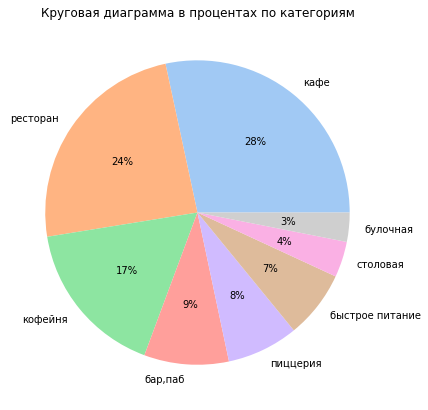

In [33]:
plt.figure(figsize = (15,7))
plt.pie(count_category['percent_all'],
        labels = count_category['category'],        
        autopct='%.0f%%')
plt.title('Круговая диаграмма в процентах по категориям')
plt.show;

Можем увидеть, что в Москве больше всего представлено кафе, целых 28%. Следующие категории это рестораны 24% и кофейни 17%. Они составляют топ-3, все остальные заведение в Москве встречаются реже\
И вполне логично, так как в кафе можно ходить хоть каждый день и кафе обычно не официальное место, если сравнивать с ресторанами. В кафе удобно зайти, когда не покушал дома или просто не готовишь себе. Поэтому вполне логично, что она преобладает над другими категориями.

**Создадим сводную таблицу для посмотрение диаграмм**

In [137]:
category = df.pivot_table(index=['category','chain'], values ='name', aggfunc=['count']).reset_index()
category.columns = ['category','chain','count']
all_category = df.pivot_table(index='category', values ='name', aggfunc=['count']).reset_index()
all_category.columns = ['category','count']
category = category.merge(all_category, how='inner', on='category').reset_index(drop=True)
category = category.rename(columns={"count_x": "counts", "count_y": "sums"})
category['percent'] = round(category['counts']/category['sums'],3) * 100
category = category.sort_values(['sums'],ascending=False).reset_index(drop=True)
category

,category,chain,counts,sums,percent
0,кафе,несетевые,1590,2364,67.3
1,кафе,сетевые,774,2364,32.7
2,ресторан,несетевые,1292,2012,64.2
3,ресторан,сетевые,720,2012,35.8
4,кофейня,несетевые,688,1400,49.1
5,кофейня,сетевые,712,1400,50.9
6,"бар,паб",несетевые,584,751,77.8
7,"бар,паб",сетевые,167,751,22.2
8,пиццерия,несетевые,301,629,47.9
9,пиццерия,сетевые,328,629,52.1


**Построим столбчатую диаграмму по категориям**

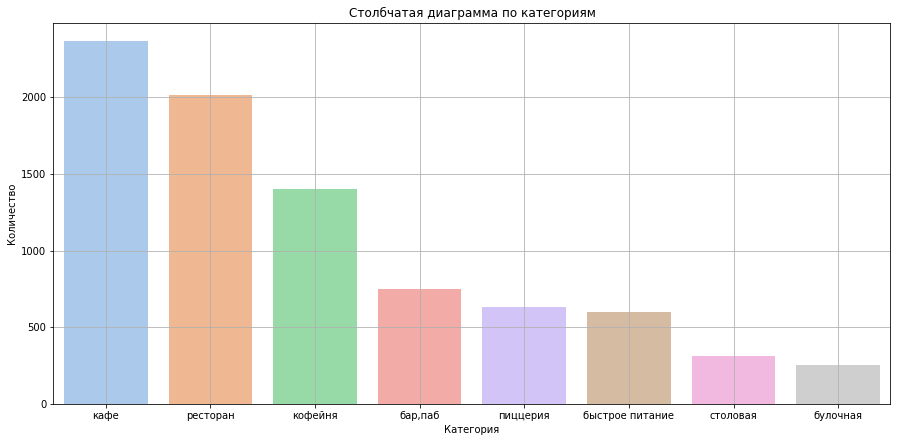

In [138]:
plt.figure(figsize = (15,7))
ax = sns.barplot(x='category', y='sums', data=category)
ax.grid(True)
plt.title('Столбчатая диаграмма по категориям')
plt.ylabel('Количество')
plt.xlabel('Категория')
plt.show;

**Построим столбчатую диаграмму по категориям с разделением на сетевые и несетевые**

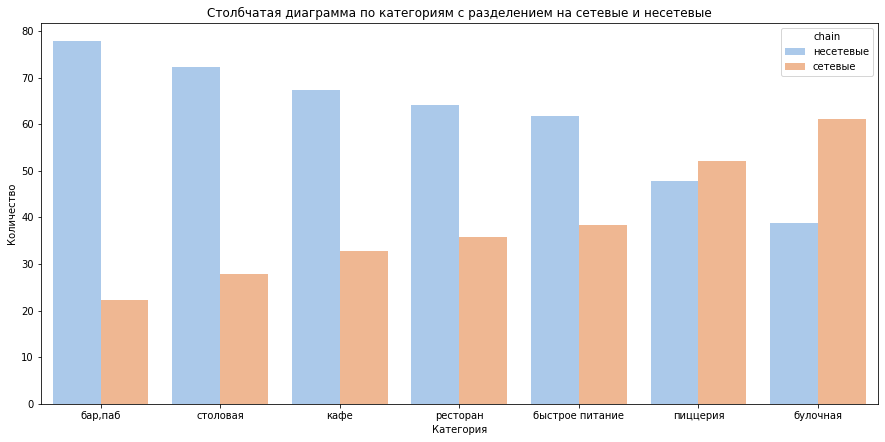

In [141]:
plt.figure(figsize = (15,7))
order=['бар,паб', 'столовая', 'кафе', 'ресторан', 'быстрое питание', 'пиццерия', 'булочная']
ax = sns.barplot(x='category', y='percent',hue='chain', data=category,order=order)
plt.title('Столбчатая диаграмма по категориям с разделением на сетевые и несетевые')
plt.ylabel('Количество')
plt.xlabel('Категория')
plt.show;

На данной диаграмме можем увидеть, что кафе, ресторанах, бар,паб, быстрое питание, столовая преобладает больше несетевыми заведениями. Это хорошие категории для того, чтобы открыть новое заведение, так как скорее всего сетевые  могут съесть одиночное заведения. Если брать к примеру бюджет на рекламу, заведений много, а бюджет один. Или люди больше доверяться сетевому гиганту, чем несетевому заведению, так как сетевые уже проверены, а одиночные нет, испортить вечер за невусной едой не сильно хочется.\
Лучше не рассматривать кофейни, пиццерии и булочные, так как там преобладает больше сетевая часть заведений.

**Вывод**

Можем увидеть, что в Москве больше всего представлено кафе, целых 28%. Следующие категории это рестораны 24% и кофейни 17%. Они составляют топ-3, все остальные заведение в Москве встречаются реже\
И вполне логично, так как в кафе можно ходить хоть каждый день и кафе обычно не официальное место, если сравнивать с ресторанами. В кафе удобно зайти, когда не покушал дома или просто не готовишь себе. Поэтому вполне логично, что она преобладает над другими категориями.\
На диаграмме по категориям с разделением на сетевые и несетевые можем увидеть, что кафе, ресторанах, бар,паб, быстрое питание, столовая преобладает больше несетевыми заведениями. Это хорошие категории для того, чтобы открыть новое заведение, так как скорее всего сетевые  могут съесть одиночное заведения. Если брать к примеру бюджет на рекламу, заведений много, а бюджет один. Или люди больше доверяться сетевому гиганту, чем несетевому заведению, так как сетевые уже проверены, а одиночные нет, испортить вечер за невусной едой не сильно хочется.\
Лучше не рассматривать кофейни, пиццерии и булочные, так как там преобладает больше сетевая часть заведений.

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

In [116]:
# Создадим сводную таблицу для построения графиков сидячих мест по категориям
seats = df.pivot_table(index=['category'], values ='seats', aggfunc=['median']).reset_index()
seats.columns = ['category','median_seats']
seats = seats.sort_values(by='median_seats', ascending=False).reset_index(drop=True)

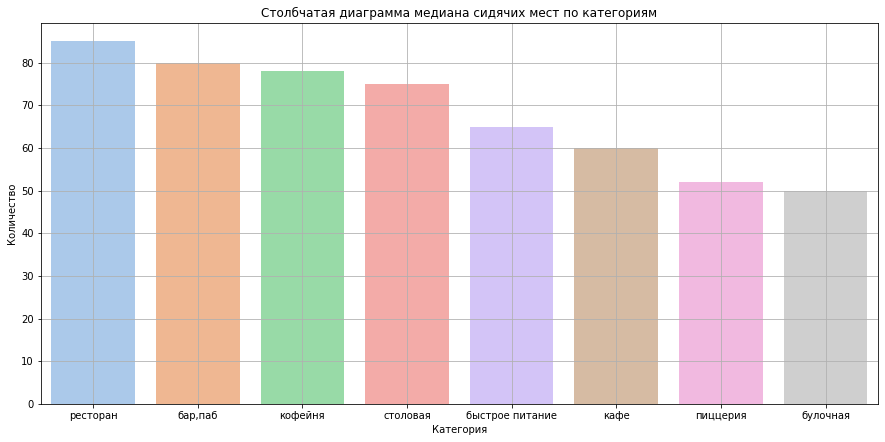

In [117]:
# Построим столбчатую диаграмму медиану сидячих мест по категориям
plt.figure(figsize = (15,7))
ax = sns.barplot(x='category', y='median_seats', data=seats)
ax.grid(True)
plt.title('Столбчатая диаграмма медиана сидячих мест по категориям')
plt.ylabel('Количество')
plt.xlabel('Категория')
plt.show;

Вполне логично, что в ресторанах преобладет наибольшая медиана по количеству мест, так как люди приходят сюда посидеть и поесть на достаточно большой промежуток времени, если сравнивать с другими заведениями, с тем же кафе к примеру, люди туда приходят на короткий промежуток времени, поесть и пойти, основная цель это поесть.\
А рестораны, это больше атмосфера, приятная компания, человек туда приходит, чтобы расслабиться и насладиться атмосферой, а не чтобы только поесть, поэтому вполне логично, что люди проводят там большое количество времени. И если брать выходные, то количество людей приходят туда много и сидят долго, поэтому нужно большое количество мест.\
Если рассматривать кофейни(находится на 3 месте),столовые(на 4 месте), то там скорее большое количество мест нужно для трафика людей, когда люди идут на работу, или в обед, или вечером, им нужно зайти ненадолго, перекусить и выпить кофе или чай и пойти дальше по своим делам, а так как в часпик людей много, то и нужно много мест. Не в часпик, заполненость кофейни небольшая.\
В бар,паб, категория которая находится на втором месте, важно большое количество мест, так как в выходные приходит большое количество людей и нужно много сидячих мест. Также это отслеживается на время работы, в выходные бары закрываются позже, так как эти дни самые прибыльные.

In [118]:
# Создадим сводную таблицу для построения графиков сидячих мест по категориям с разделением на сетевые и несетевые
seats = df.pivot_table(index=['category','chain'], values ='seats', aggfunc=['median']).reset_index()
seats.columns = ['category','chain','median_seats']
seats = seats.sort_values(by=['median_seats'], ascending=False).reset_index(drop=True)

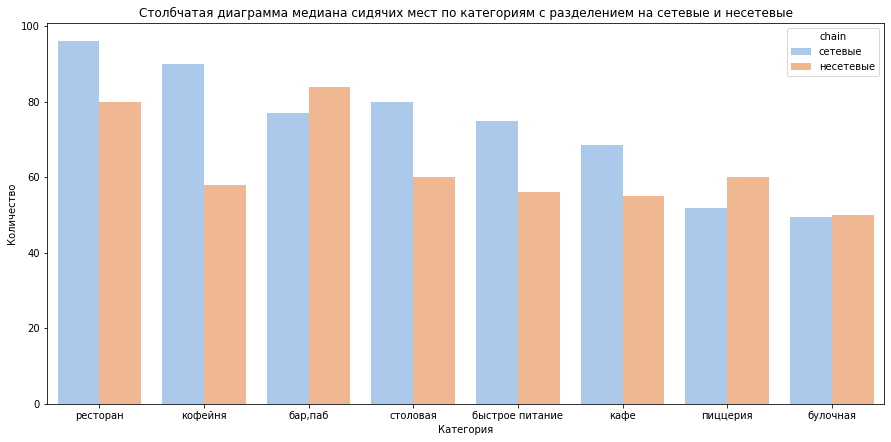

In [127]:
# Построим столбчатую диаграмму медиану сидячих мест по категориям с разделением на сетевые и несетевые
plt.figure(figsize = (15,7))
ax = sns.barplot(x='category', y='median_seats', data=seats, hue = 'chain')
plt.title('Столбчатая диаграмма медиана сидячих мест по категориям с разделением на сетевые и несетевые')
plt.ylabel('Количество')
plt.xlabel('Категория')
plt.show;

На данной диаграмме также можем увидеть прослеживание влияние сетевых заведений на количество мест. В сетевых ресторанах, кофейнях, столовых, заведениях быстрого питания, кафе преобладает медиана количество мест относительно несетевых. Это связано с тем, что большинство людей предпочитают проверенные места и вполне логично из этого, что сидячих мест там должно быть больше.\
В категории бар,паб можем увидеть, что мест в несетевых заведений немного больше, скорее всего это связано с тем, что нет больших сеток в Москве баров или пабов.

**Вывод**

Вполне логично, что в ресторанах преобладет наибольшая медиана по количеству мест, так как люди приходят сюда посидеть и поесть на достаточно большой промежуток времени, если сравнивать с другими заведениями, с тем же кафе к примеру, люди туда приходят на короткий промежуток времени, поесть и пойти, основная цель это поесть.\
А рестораны, это больше атмосфера, приятная компания, человек туда приходит, чтобы расслабиться и насладиться атмосферой, а не чтобы только поесть, поэтому вполне логично, что люди проводят там большое количество времени. И если брать выходные, то количество людей приходят туда много и сидят долго, поэтому нужно большое количество мест.\
Если рассматривать кофейни(находится на 3 месте),столовые(на 4 месте), то там скорее большое количество мест нужно для трафика людей, когда люди идут на работу, или в обед, или вечером, им нужно зайти ненадолго, перекусить и выпить кофе или чай и пойти дальше по своим делам, а так как в часпик людей много, то и нужно много мест. Не в часпик, заполненость кофейни небольшая.\
В бар,паб, категория которая находится на втором месте, важно большое количество мест, так как в выходные приходит большое количество людей и нужно много сидячих мест. Также это отслеживается на время работы, в выходные бары закрываются позже, так как эти дни самые прибыльные.

На столбчатой диаграмме медиана сидячих мест по категориям с разделением на сетевые и несетевые также можем увидеть прослеживание влияние сетевых заведений на количество мест. В сетевых ресторанах, кофейнях, столовых, заведениях быстрого питания, кафе преобладает медиана количество мест относительно несетевых. Это связано с тем, что большинство людей предпочитают проверенные места и вполне логично из этого, что сидячих мест там должно быть больше.\
В категории бар,паб можем увидеть, что мест в несетевых заведений немного больше, скорее всего это связано с тем, что нет больших сеток в Москве баров или пабов.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Определим, каких заведений больше

In [41]:
# Создадим сводную таблицу для построения столбчатой диаграммы соотношения сетевых и несетевых заведений
chain_or_not = df.pivot_table(index='chain', values ='name', aggfunc='count').reset_index()
chain_or_not['percent'] = round(chain_or_not['name'] / df['name'].count(),3)*100


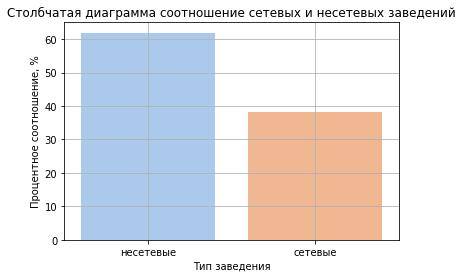

In [42]:
# Построим столбчатую диаграмму соотношение сетевых и несетевых заведений
ax = sns.barplot(x='chain', y='percent', data=chain_or_not)
ax.grid(True)
plt.title('Столбчатая диаграмма соотношение сетевых и несетевых заведений')
plt.ylabel('Процентное соотношение, %')
plt.xlabel('Тип заведения')
plt.show;

**Вывод**

Можем увидеть, что несетевых заведений примерно 62%, а несетевых 38%. Это радостно увидеть, так как чем больше сетевых, тем тяжелее выйти одиночному заведению на рынок, так как скорее всего несетевое заведение не выдержить конкуренцию и давку сетевых.

### Определим, какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

In [43]:
# Создадим сводную таблицу для построения столбчатой диаграммы по кол-во сетевых заведений на категорию
chain_category = (df[df['chain']=='сетевые']
                  .pivot_table(index='category',values='name',aggfunc='count')
                  .sort_values('name',ascending=False)
                  .reset_index())
chain_category

,category,name
0,кафе,774
1,ресторан,720
2,кофейня,712
3,пиццерия,328
4,быстрое питание,230
5,"бар,паб",167
6,булочная,156
7,столовая,87


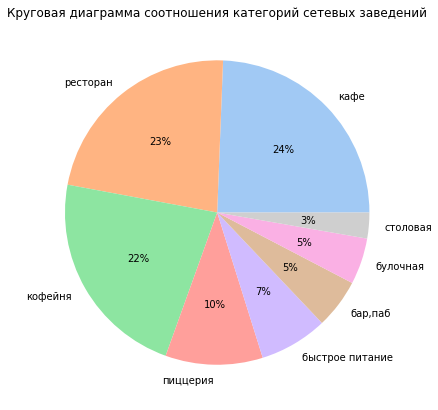

In [44]:
# Построим столбчатую диаграмму соотношение категорий сетевых заведений
plt.figure(figsize = (15,7))
plt.pie(chain_category['name'],
        labels = chain_category['category'],        
        autopct='%.0f%%')
plt.title('Круговая диаграмма соотношения категорий сетевых заведений')
plt.show;

**Вывод**

Топ-3 категории сетевых заведений, которые занимают почти 70% рынка, это кафе, ресторан, кофейни.\
Остальные категории намного меньше.

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим подходящую для такой информации визуализацию

In [45]:
# Создадим сводную таблицу с топ-15 заведениями по кол-ву
top_15 = (df[df['chain'] == 'сетевые'].pivot_table(index=['name'], values='lat',aggfunc='count')
 .sort_values(by='lat',ascending=False)
 .head(15))
top_15 = (top_15.merge(df,how='inner',on='name')
          .drop_duplicates(subset=['name']).reset_index(drop=True)[['name','category','lat_x']])
top_15 = top_15.rename(columns={'lat_x':'counts'})
top_15

,name,category,counts
0,Шоколадница,кофейня,117
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,70
4,Яндекс Лавка,ресторан,68
5,Cofix,кофейня,65
6,Prime,ресторан,50
7,Хинкальная,быстрое питание,44
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,38


**Визуализируем топ_15**

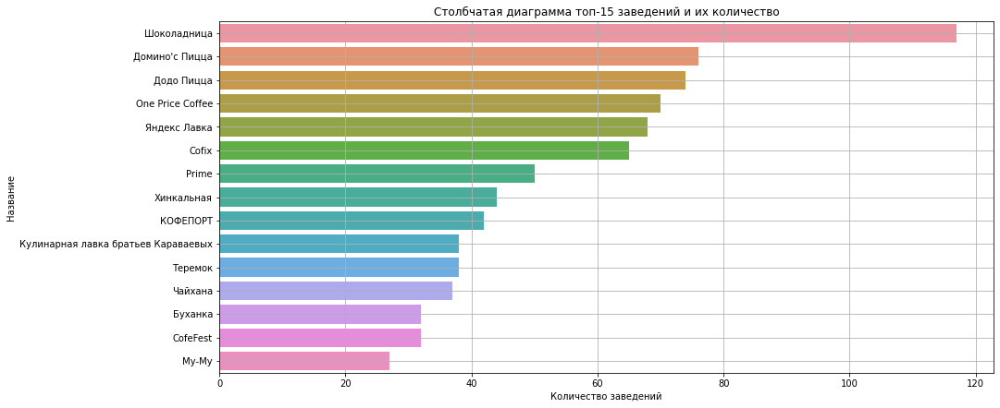

In [46]:
plt.figure(figsize = (15,7))
ax1= sns.barplot(x='counts',y='name',data=top_15)
ax1.grid(True)
plt.title('Столбчатая диаграмма топ-15 заведений и их количество')
plt.ylabel('Название')
plt.xlabel('Количество заведений')
plt.show;

**Вывод**

На рынке, кофейня Шоколадница занимает первое место и 117 заведений с большим отрывом относительно других заведений этого топа.\
Все остальные заведения уменьшаются плавно по количество заведений. Пиццерии Домино'с Пицца с 76 заведениями и Додо Пицца с 74 заведениями, закрывают топ-3.\
На четвертом месте тоже кофенйя One Price Coffee\
Если посмотреть на этот топ-4 сетевых заведений, то можно сделать вывод, что если открывать заведение этого типо, то нужно либо много денег, чтобы конкурировать с ними, либо должно быть место, где далеко от этих заведений и много людей ходит.

### Посмотрим, какие административные районы присутствуют в датасете и посмотрим на количество заведений в них

In [47]:
# Построим сводную таблицу, чтобы увидеть кол-во заведений на район
all_district = df.pivot_table(index='district', values ='name', aggfunc='count').sort_values(by='name',ascending=False).reset_index()
all_district

,district,name
0,Центральный административный округ,2226
1,Южный административный округ,890
2,Северо-Восточный административный округ,889
3,Северный административный округ,873
4,Западный административный округ,829
5,Восточный административный округ,788
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,707
8,Северо-Западный административный округ,409


In [48]:
district = df.pivot_table(index=['district','category'], values='name',aggfunc='count').reset_index()
district = district.merge(all_district, how='inner', on='district').sort_values(by=['name_y','name_x'],ascending=False).reset_index(drop=True)
district = district.rename(columns={'name_x':'Количество','name_y':'quantity_in_district','category':'Категория','district':'Район'})
district['Процент'] = round(district['Количество'] / district['quantity_in_district'],3) * 100

In [49]:
fig = px.bar(district,
             x = "Район",
             y = "Количество",
             color="Категория", 
             title = "Распределение заведений по районам в количественном соотношении")
fig.show();

Вполне логично увидеть, что больше всего заведений расположено в центре Москвы, так как в основном там течет вся жизнь города.\
Остальные районы имеют меньше чем в центральном, но примерно одинаково относительно друг друга. Кроме северо-западного района, скорее всего это связано с тем, что в этом районе много природы и мало жилых домов.

In [50]:
fig = px.bar(district,
             x = "Район",
             y = "Процент",
             color="Категория", 
             title = "Распределение заведений по районам в процентном соотношении")
fig.show();

Можем увидеть, что в районах, кроме центра, больше преобладают кафе и кофейни, чем ресторанах. В центре рестораны занимают первое место по количеству.\
Скорее всего это связано с тем, что люди выбирают кофейни и кафе для быстрого перекуса. 

**Вывод**

Вполне логично увидеть, что больше всего заведений расположено в центре Москвы, так как в основном там течет вся жизнь города.\
Остальные районы имеют меньше чем в центральном, но примерно одинаково относительно друг друга. Кроме северо-западного района, скорее всего это связано с тем, что в этом районе много природы и мало жилых домов.

Можем увидеть, что в районах, кроме центра, больше преобладают кафе и кофейни, чем ресторанах. В центре рестораны занимают первое место по количеству.\
Скорее всего это связано с тем, что люди выбирают кофейни и кафе для быстрого перекуса. 

### Визуализируем распределение средних рейтингов по категориям заведений. Определим, насколько сильно различаются рейтинги в разных типах общепита

In [51]:
category_rating = (df.pivot_table(index='category',values='rating',aggfunc='mean')
                   .sort_values(by='rating',ascending=False)
                   .reset_index())
category_rating

,category,rating
0,"бар,паб",4.389214
1,пиццерия,4.300636
2,ресторан,4.287674
3,кофейня,4.277429
4,булочная,4.267843
5,столовая,4.211821
6,кафе,4.125338
7,быстрое питание,4.049917


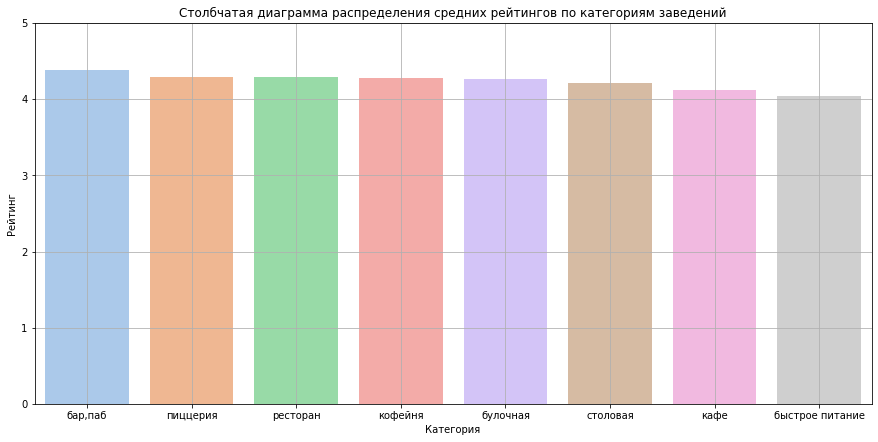

In [52]:
plt.figure(figsize = (15,7))
ax = sns.barplot(x='category', y='rating', data=category_rating)
ax.grid(True)
ax.set_ylim([0, 5])
plt.title('Столбчатая диаграмма распределения средних рейтингов по категориям заведений')
plt.ylabel('Рейтинг')
plt.xlabel('Категория')
plt.show;

**Вывод**

Можем увидеть, что средний рейтинг по категориям больше 4, на первом месте стоит категория с барами и пабами\
пиццерия, ресторан, кофейня, булочная не сильно отличаются по рейтингу.\
Столовая, кафе и быстрое питание занимают нижний топ-3 по рейтингу

### Построим хороплет со средним рейтингом заведений каждого района.

In [53]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174873
1,Западный административный округ,4.179855
2,Северный административный округ,4.238373
3,Северо-Восточный административный округ,4.151519
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.375741
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172419
8,Южный административный округ,4.184157


In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(moscow_map)

# выводим карту
moscow_map

**Вывод**

Из хороплета можем сделать вывод, что наибольший рейтинг у заведений, которые находятся в центральном районе. Вполне логично, так как конкуренция заставляет держаться на уровне.

### Отобразим все заведения датасета на карте с помощью кластеров

In [55]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
moscow_map

**Вывод**

Построили хороплет по заведениям.

### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [56]:
top_15_streets = df.pivot_table(index='street',values='name',aggfunc='count').sort_values(by='name',ascending=False).reset_index().head(15)
top_15_streets

,street,name
0,проспект Мира,182
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Дмитровское шоссе,87
5,Варшавское шоссе,76
6,Каширское шоссе,76
7,Ленинградский проспект,71
8,Ленинградское шоссе,69
9,МКАД,65


In [57]:
street = df.pivot_table(index=['street','category'], values='name',aggfunc='count').sort_values(by=['name','street'],ascending=False).reset_index()
street = street.merge(top_15_streets, how='inner', on='street').sort_values(by=['name_y','name_x'],ascending=False).reset_index(drop=True)
street = street.rename(columns={'name_x':'Количество','name_y':'quantity_in_street','category':'Категория','street':'Улица'})
street['Процент'] = round(street['Количество'] / street['quantity_in_street'],3) * 100

In [58]:
fig = px.bar(street,
             x = "Улица",
             y = "Количество",
             color="Категория",
             title = "Распределение заведений по топ-15 улицам в количественном соотношении")
fig.show();

Топ-3 улиц занимает: проспект Мира, Профсоюзная улица, Ленинский проспект. Это одни из самых длинных улиц Москвы, поэтому не странно увидеть их в топе по количеству заведений.\
Также интересно заметить, что на МКАДе всего 5 ресторанов и 45 кафе, это связано с тем, что люди там долго не задерживаются

In [59]:
fig = px.bar(street,
             x = "Улица", 
             y = "Процент",
             color="Категория",
             title = "Распределение заведений по топ-15 улицам в процентном соотношении")
fig.show();

Можем увидеть, что на распределение заведений по топ-15 улицам в процентном соотношении в основном категории и процентное соотношении похожи, кроме МКАД.

**Вывод**

Топ-3 улиц занимает: проспект Мира, Профсоюзная улица, Ленинский проспект. Это одни из самых длинных улиц Москвы, поэтому не странно увидеть их в топе по количеству заведений.\
Также интересно заметить, что на МКАДе всего 5 ресторанов и 45 кафе, это связано с тем, что люди там долго не задерживаются

Можем увидеть, что на распределение заведений по топ-15 улицам в процентном соотношении в основном категории и процентное соотношении похожи, кроме МКАД.


### Найдем улицы, на которых находится только один объект общепита

In [60]:
one_street = df.pivot_table(index='street', values='name',aggfunc='count').sort_values(by='name').reset_index()
one_street = one_street[one_street['name'] == 1]
one_street = pd.merge(one_street[['street']],df[['street','district','name','category','lat','lng','rating']],on='street', how='left')
one_street.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 455 entries, 0 to 454
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   street    455 non-null    object 
 1   district  455 non-null    object 
 2   name      455 non-null    object 
 3   category  455 non-null    object 
 4   lat       455 non-null    float64
 5   lng       455 non-null    float64
 6   rating    455 non-null    float64
dtypes: float64(3), object(4)
memory usage: 28.4+ KB


Было найдено 455 таких улиц с одним заведением

**Построим хороплет, чтобы увидеть эти заведения**

In [61]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_street.apply(create_clusters, axis=1)

# выводим карту
moscow_map

**Посмотрим по районам**

In [62]:
one_street.pivot_table(index='district',values='name',aggfunc='count').sort_values(by='name',ascending=False)

,name
district,
Центральный административный округ,142
Северо-Восточный административный округ,55
Восточный административный округ,52
Северный административный округ,52
Южный административный округ,43
Юго-Восточный административный округ,39
Западный административный округ,35
Северо-Западный административный округ,19
Юго-Западный административный округ,18


**Вывод**

Также можем увидеть, что в центре количество улиц с одним заведением преобладает, скорее всего это связано с тем, что в центре много маленьких улиц, и из-за этого заведения оказываются одни на улице. Но это не значит что они отдалены от других заведений, это связано с тем, что улицы короткие

### Посчитаем медиану столбца со средним чеком для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района

In [63]:
district_middle_avg_bill = df.pivot_table(index='district',values='middle_avg_bill',aggfunc='median').sort_values(by='middle_avg_bill',ascending=False).reset_index()
district_middle_avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [64]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная цена чека заведений разделенная по районам',
).add_to(moscow_map)

# выводим карту
moscow_map

**Вывод**

На хороплете интересно увидеть, что в центральном и в западном районе цена медаиного чека выше, чем в других районах, это связано с тем, что западный и центральный всегда считались престижными района, поэтому цена там выше, и цена аренды скорее всего тоже выше, относительно других районов.\
Южном, Юго-Восточном и Северо-Восточном районе цена ниже, так как цена площади тоже дешевле, если сравнивать с другими районами.

### Построим соотношения заведений, которые работают ночью к округу

In [65]:
district_is_24 = (df.pivot_table(index=['district','is_24/7'],values='name',aggfunc='count')
 .sort_values(by=['district','name'],ascending=False)
 .reset_index())
district_count = df.pivot_table(index='district', values ='name', aggfunc='count').reset_index()
district_is_24 = district_is_24.merge(district_count, how='inner', on='district').reset_index(drop=True)
district_is_24 = district_is_24.rename(columns={"name_x": "counts", "name_y": "sums"})
district_is_24['percent'] = round(district_is_24['counts']/district_is_24['sums'],3) * 100
district_is_24_True = (district_is_24[district_is_24['is_24/7'] == 'True']
                       .sort_values('percent',ascending=False)
                       .reset_index(drop=True))
district_is_24_True

,district,is_24/7,counts,sums,percent
0,Юго-Восточный административный округ,True,93,714,13.0
1,Восточный административный округ,True,97,788,12.3
2,Северо-Западный административный округ,True,43,409,10.5
3,Юго-Западный административный округ,True,73,707,10.3
4,Северо-Восточный административный округ,True,75,889,8.4
5,Западный административный округ,True,70,829,8.4
6,Южный административный округ,True,74,890,8.3
7,Северный административный округ,True,70,873,8.0
8,Центральный административный округ,True,131,2226,5.9


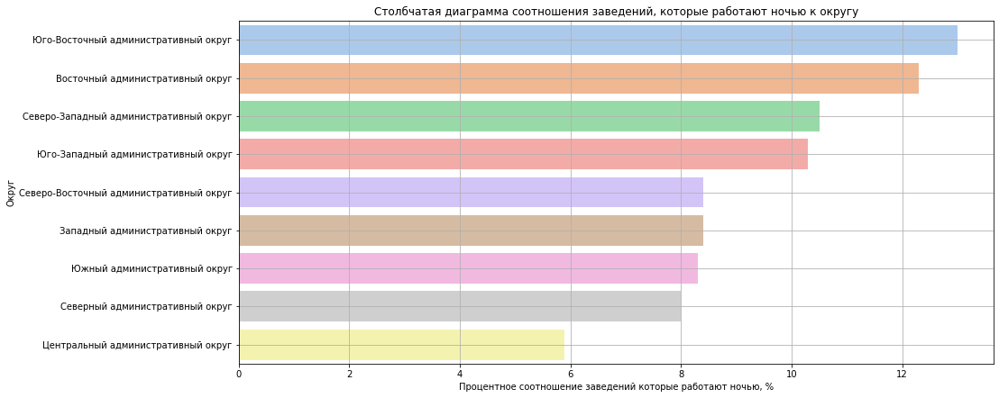

In [66]:
plt.figure(figsize = (15,7))
ax = sns.barplot(x='percent', y='district', data=district_is_24_True)
ax.grid(True)
plt.title('Столбчатая диаграмма соотношения заведений, которые работают ночью к округу')
plt.xlabel('Процентное соотношение заведений которые работают ночью, %')
plt.ylabel('Округ')
plt.show;

**Вывод**

Из полученной диаграммы видно, что заведения, которые работают ночью, больше расположены в жилых районах.\
Лидирующее место занимает Юго-Восточный округ, там работает 13% от всех заведений в этом округе.\
В центре всего 5.9% таких заведений, относительно всех заведений

### Построим соотношение категорий ночных заведений к их количеству по округам

In [67]:
districts = df[df['is_24/7']=='True'].pivot_table(index=['district','category'], values='name',aggfunc='count').sort_values(by=['district','name'],ascending=False).reset_index()
districts
districts_night = df[df['is_24/7']=='True'].pivot_table(index='district', values='name',aggfunc='count').reset_index()
districts = districts.merge(districts_night, how='inner', on='district').sort_values(by=['name_y','name_x'],ascending=False).reset_index(drop=True)
districts = districts.rename(columns={'name_x':'Количество','name_y':'quantity_in_street','category':'Категория','district':'Округ'})
districts['Процент'] = round(districts['Количество'] / districts['quantity_in_street'],3) * 100

In [68]:
fig = px.bar(districts,
             x = "Округ",
             y = "Процент",
             color="Категория",
             title = "Отношение категорий ночных заведений к количеству ночных заведений")
fig.show();

**Вывод**

В центральном округе 4 категории заведений: кафе, бары, кофейни, рестораны - занимают примерно одинаковый процент\
В других округах преобладают больше кафе и за ними идут заведения быстрого питания.\
Из спальных округов выбивается только Северно-Западный, там преобладают больше рестораны.

### Посмотрим на распеределение по категориям заведений, которые работают ночью

In [69]:
category_is_24 = (df[df['is_24/7'] == 'True'].pivot_table(index=['category','is_24/7'],values='name',aggfunc='count')
 .sort_values(by=['category','name'],ascending=False)
 .reset_index())
category_count = df.pivot_table(index='category', values ='name', aggfunc='count').reset_index()
category_is_24 = category_is_24.merge(category_count, how='inner', on='category').reset_index(drop=True)
category_is_24 = category_is_24.rename(columns={"name_x": "counts", "name_y": "sums"})
category_is_24['percent'] = round(category_is_24['counts']/category_is_24['sums'],3) * 100
category_is_24 = category_is_24.sort_values(by='percent',ascending=False)
category_is_24

,category,is_24/7,counts,sums,percent
5,быстрое питание,True,150,601,25.0
4,кафе,True,266,2364,11.3
6,булочная,True,24,255,9.4
7,"бар,паб",True,52,751,6.9
1,ресторан,True,132,2012,6.6
2,пиццерия,True,31,629,4.9
3,кофейня,True,59,1400,4.2
0,столовая,True,12,313,3.8


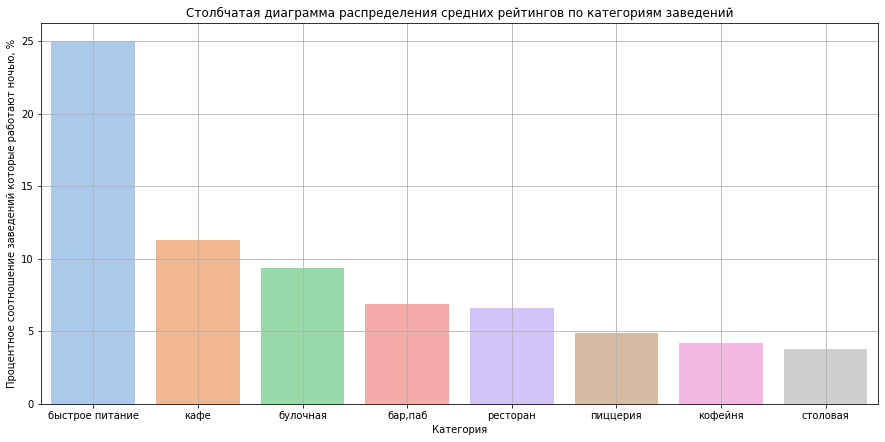

In [70]:
plt.figure(figsize = (15,7))
ax = sns.barplot(x='category', y='percent', data=category_is_24)
ax.grid(True)
plt.title('Столбчатая диаграмма распределения средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Процентное соотношение заведений которые работают ночью, %')
plt.show;

**Вывод**

Вполне можно было предположить, что категория с быстрым питанием ночью занимают наибольншую долю, так как люядм ночью нужно быстро перекусить

### Общий вывод по исследовательскому анализу

* **Посмотрели, какие категории заведений представлены в данных. Исследовали количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построимливизуализации. Ответили на вопрос о распределении заведений по категориям.**\
    Можем увидеть, что в Москве больше всего представлено кафе, целых 28%. Следующие категории это рестораны 24% и кофейни 17%. Они составляют топ-3, все остальные заведение в Москве встречаются реже\
    И вполне логично, так как в кафе можно ходить хоть каждый день и кафе обычно не официальное место, если сравнивать с ресторанами. В кафе удобно зайти, когда не покушал дома или просто не готовишь себе. Поэтому вполне логично, что она преобладает над другими категориями.\
    На диаграмме по категориям с разделением на сетевые и несетевые можем увидеть, что кафе, ресторанах, бар,паб, быстрое питание, столовая преобладает больше несетевыми заведениями. Это хорошие категории для того, чтобы открыть новое заведение, так как скорее всего сетевые  могут съесть одиночное заведения. Если брать к примеру бюджет на рекламу, заведений много, а бюджет один. Или люди больше доверяться сетевому гиганту, чем несетевому заведению, так как сетевые уже проверены, а одиночные нет, испортить вечер за невусной едой не сильно хочется.\
    Лучше не рассматривать кофейни, пиццерии и булочные, так как там преобладает больше сетевая часть заведений.


* **Исследовали количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построили визуализации. Проанализировали результаты и сделаем выводы.**\
    Вполне логично, что в ресторанах преобладет наибольшая медиана по количеству мест, так как люди приходят сюда посидеть и поесть на достаточно большой промежуток времени, если сравнивать с другими заведениями, с тем же кафе к примеру, люди туда приходят на короткий промежуток времени, поесть и пойти, основная цель это поесть.\
    А рестораны, это больше атмосфера, приятная компания, человек туда приходит, чтобы расслабиться и насладиться атмосферой, а не чтобы только поесть, поэтому вполне логично, что люди проводят там большое количество времени. И если брать выходные, то количество людей приходят туда много и сидят долго, поэтому нужно большое количество мест.\
    Если рассматривать кофейни(находится на 3 месте),столовые(на 4 месте), то там скорее большое количество мест нужно для трафика людей, когда люди идут на работу, или в обед, или вечером, им нужно зайти ненадолго, перекусить и выпить кофе или чай и пойти дальше по своим делам, а так как в часпик людей много, то и нужно много мест. Не в часпик, заполненость кофейни небольшая.\
    В бар,паб, категория которая находится на втором месте, важно большое количество мест, так как в выходные приходит большое количество людей и нужно много сидячих мест. Также это отслеживается на время работы, в выходные бары закрываются позже, так как эти дни самые прибыльные.

    На столбчатой диаграмме медиана сидячих мест по категориям с разделением на сетевые и несетевые также можем увидеть прослеживание влияние сетевых заведений на количество мест. В сетевых ресторанах, кофейнях, столовых, заведениях быстрого питания, кафе преобладает медиана количество мест относительно несетевых. Это связано с тем, что большинство людей предпочитают проверенные места и вполне логично из этого, что сидячих мест там должно быть больше.\
    В категории бар,паб можем увидеть, что мест в несетевых заведений немного больше, скорее всего это связано с тем, что нет больших сеток в Москве баров или пабов.
    
* **Рассмотрели и изобразили соотношение сетевых и несетевых заведений в датасете. Определили, каких заведений больше.**\
    Топ-3 категории сетевых заведений, которые занимают почти 70% рынка, это кафе, ресторан, кофейни.\
    Остальные категории намного меньше.
    
* **Сгруппировали данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построили подходящую для такой информации визуализацию**\
    На рынке, кофейня Шоколадница занимает первое место и 117 заведений с большим отрывом относительно других заведений этого топа.\
    Все остальные заведения уменьшаются плавно по количество заведений. Пиццерии Домино'с Пицца с 76 заведениями и Додо Пицца с 74 заведениями, закрывают топ-3.\
    На четвертом месте тоже кофенйя One Price Coffee\
    Если посмотреть на этот топ-4 сетевых заведений, то можно сделать вывод, что если открывать заведение этого типо, то нужно либо много денег, чтобы конкурировать с ними, либо должно быть место, где далеко от этих заведений и много людей ходит.
    
* **Посмотрели, какие административные районы присутствуют в датасете и посмотрели на количество заведений в них**\
    Вполне логично увидеть, что больше всего заведений расположено в центре Москвы, так как в основном там течет вся жизнь города.\
    Остальные районы имеют меньше чем в центральном, но примерно одинаково относительно друг друга. Кроме северо-западного района, скорее всего это связано с тем, что в этом районе много природы и мало жилых домов.

    Можем увидеть, что в районах, кроме центра, больше преобладают кафе и кофейни, чем ресторанах. В центре рестораны занимают первое место по количеству.\
    Скорее всего это связано с тем, что люди выбирают кофейни и кафе для быстрого перекуса. 

* **Визуализирволи распределение средних рейтингов по категориям заведений. Определили, насколько сильно различаются рейтинги в разных типах общепита**\
    Можем увидеть, что средний рейтинг по категориям больше 4, на первом месте стоит категория с барами и пабами\
    пиццерия, ресторан, кофейня, булочная не сильно отличаются по рейтингу.\
    Столовая, кафе и быстрое питание занимают нижний топ-3 по рейтингу

* **Построили хороплет со средним рейтингом заведений каждого района.**\
    Из хороплета можем сделать вывод, что наибольший рейтинг у заведений, которые находятся в центральном районе. Вполне логично, так как конкуренция заставляет держаться на уровне.
    
* **Отобразили все заведения датасета на карте с помощью кластеров**\

* **Нашли топ-15 улиц по количеству заведений. Построили график распределения количества заведений и их категорий по этим улицам.**\
    Топ-3 улиц занимает: проспект Мира, Профсоюзная улица, Ленинский проспект. Это одни из самых длинных улиц Москвы, поэтому не странно увидеть их в топе по количеству заведений.\
    Также интересно заметить, что на МКАДе всего 5 ресторанов и 45 кафе, это связано с тем, что люди там долго не задерживаются

    Можем увидеть, что на распределение заведений по топ-15 улицам в процентном соотношении в основном категории и процентное соотношении похожи, кроме МКАД.
    
* **Нашли улицы, на которых находится только один объект общепита**\
    Также можем увидеть, что в центре количество улиц с одним заведением преобладает, скорее всего это связано с тем, что в центре много маленьких улиц, и из-за этого заведения оказываются одни на улице. Но это не значит что они отдалены от других заведений, это связано с тем, что улицы короткие
    
* **Посчитали медиану middle_avg_bill для каждого района. Использовали это значение в качестве ценового индикатора района. Построили фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировали цены в центральном административном округе и других. Выяснили, как удалённость от центра влияет на цены в заведениях**\
    На хороплете интересно увидеть, что в центральном и в западном районе цена медаиного чека выше, чем в других районах, это связано с тем, что западный и центральный всегда считались престижными района, поэтому цена там выше, и цена аренды скорее всего тоже выше, относительно других районов.\

* **Построили соотношения заведений, которые работают ночью к округу**\
    Из полученной диаграммы видно, что заведения, которые работают ночью, больше расположены в жилых районах.\
    Лидирующее место занимает Юго-Восточный округ, там работает 13% от всех заведений в этом округе.\
    В центре всего 5.9% таких заведений, относительно всех заведений

* **Посмотрели на распеределение по категориям заведений, которые работают ночью**\
    Вполне можно было предположить, что категория с быстрым питанием ночью занимают наибольншую долю, так как люядм ночью нужно быстро перекусить


## Детализируем исследование: открытие кофейни


### Посмотрим, сколько всего кофеин

In [71]:
df[df['category'] == 'кофейня']['name'].count()

1400

### Построим распределение по округам

In [72]:
coffee_district = df[df['category'] == 'кофейня'].pivot_table(index='district',values='name',aggfunc='count').sort_values(by='name',ascending=False).reset_index()

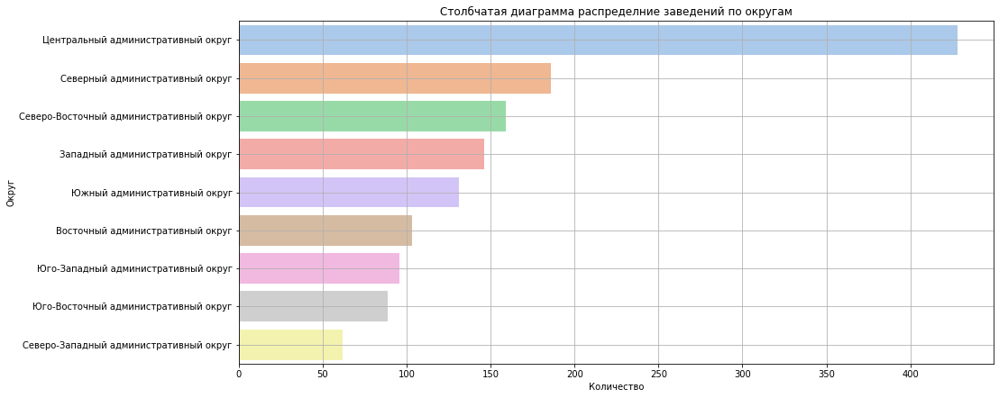

In [73]:
plt.figure(figsize = (15,7))
ax = sns.barplot(x='name', y='district', data=coffee_district)
ax.grid(True)
plt.title('Столбчатая диаграмма распределние заведений по округам')
plt.xlabel('Количество')
plt.ylabel('Округ')
plt.show;

Можно сделать вывод, что больше всего кофеин расположено в центре. В других округах их меньше, скорее всего это связано с тем, что основная жизнь города проходит в центре, поэтому там их много.

### Построим хороплет по кофейням

In [74]:
coffee = df[df['category'] == 'кофейня']

In [75]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

### Посмотрим, есть ли круглосуточные кофейни

In [76]:
coffee.loc[coffee['is_24/7'] == 'True']['name'].count()

59

Было найдено 59 кофейн, которые работают в ночное время, из 1400 кофейн, это всего 4,21% от всех. Не имеет смысла держать откытую кофейню ночью. 

### Посмотрим, какие у кофеен рейтинги и как они распределяются по районам

In [77]:
coffee_rating = coffee.pivot_table(index='district',values='rating',aggfunc='mean').sort_values(by='rating',ascending=False).reset_index()
coffee_rating

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291935
3,Восточный административный округ,4.285437
4,Юго-Западный административный округ,4.283333
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.193151


In [78]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(moscow_map)

# выводим карту
moscow_map

Можем увидеть, что наилучший рейтинг у кофейн, которые находятся в центре или Северо-Западный округе.\
В центре такой высокий рейтинг связан с тем, что там большая конкуренция и заведениям приходится трудиться над качеством, чтобы люди шли к ним.\
Странно увидеть, что в Западном округе самый низкий средний рейтинг. Это направление Москвы считается состоятельный, поэтому это хорошее направление для рассмотрения варианта открытия кофейни.

### Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии

In [79]:
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевые,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевые,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,Люблинская улица,False
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,несетевые,206.0,Волгоградский проспект,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевые,NaN,Грайвороновская улица,False
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,несетевые,NaN,Новохохловская улица,False


In [80]:
coffee_bill = coffee.pivot_table(index='district',values='middle_coffee_cup',aggfunc='median').sort_values(by='middle_coffee_cup',ascending=False).reset_index()
coffee_bill

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [81]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Также сразу создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана цены чашки по округам',
).add_to(moscow_map)

# выводим карту
moscow_map

Можем увидеть, что медиана по среднему чеку, выше всего в Юго-Западном округе и в центре. Если рассмотреть по западному направлению, то можем увидеть, что цена чашки на 3 месте, при этом рейтинг ниже всех, возможно все кроется в обслуживании.\
Если посмотреть на цены конкурентов, то можем примерно понять, сколько будет выходят одна чашка кофе, так как в цену уже заложены все расходы(зарплата, аренда, налог и т.д.)

### Посмотрим по округам, сколько сетевых и несетевых заведений

In [82]:
# Создадим сводную таблицу для построения столбчатой диаграммы соотношения сетевых и несетевых заведений по округам
coffee_chain = coffee.pivot_table(index=['chain','district'], values ='name', aggfunc='count').reset_index()
all_category = coffee.pivot_table(index='district', values ='name', aggfunc=['count']).reset_index()
all_category.columns = ['district','count']
coffee_chain = coffee_chain.merge(all_category, how='inner', on='district').reset_index(drop=True)
coffee_chain['percent'] = round(coffee_chain['name'] / coffee_chain['count'],3)*100
coffee_chain = coffee_chain.sort_values(by='count', ascending=False)
coffee_chain

,chain,district,name,count,percent
10,несетевые,Центральный административный округ,207,428,48.4
11,сетевые,Центральный административный округ,221,428,51.6
4,несетевые,Северный административный округ,93,186,50.0
5,сетевые,Северный административный округ,93,186,50.0
6,несетевые,Северо-Восточный административный округ,80,159,50.3
7,сетевые,Северо-Восточный административный округ,79,159,49.7
2,несетевые,Западный административный округ,55,146,37.7
3,сетевые,Западный административный округ,91,146,62.3
17,сетевые,Южный административный округ,66,131,50.4
16,несетевые,Южный административный округ,65,131,49.6


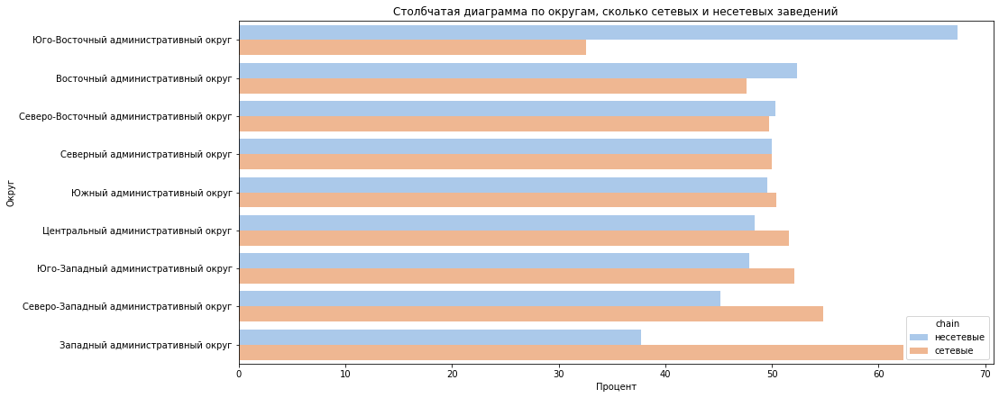

In [143]:
plt.figure(figsize = (15,7))
order=['Юго-Восточный административный округ', 'Восточный административный округ', 'Северо-Восточный административный округ', 'Северный административный округ', 'Южный административный округ', 'Центральный административный округ', 'Юго-Западный административный округ', 'Северо-Западный административный округ', 'Западный административный округ']
ax = sns.barplot(x='percent', y='district',hue='chain', data=coffee_chain, order=order)
order=coffee_chain['chain']
plt.title('Столбчатая диаграмма по округам, сколько сетевых и несетевых заведений')
plt.ylabel('Округ')
plt.xlabel('Процент')
plt.show;

Можем увидеть, что больше всего сетевых заведений находится в Западном округе, с ними тяжелее конкурировать, но если раскрутить новое заведение, то есть возможность обогнать их по сервису, и иметь высокий рейтинг.\
В Юго-Восточном рейтинге сетевых заведений меньше 35%, поэтому хорошая возможность рассмотреть здесь тоже кофейню.\
И если брать центр, то там почти поровну сетевых и несетевых, поэтому тоже можно рассмотреть.

### Вывод и Рекомендации

Какие выводы мы можем сделать:
* Всего кофейн 1400
* Если рассмотреть по округам, то можно сделать вывод, что больше всего кофеин расположено в центре. В других округах их меньше, скорее всего это связано с тем, что основная жизнь города проходит в центре, поэтому там их много
* Было найдено 59 кофейн, которые работают в ночное время, из 1400 кофейн, это всего 4,21% от всех. Не имеет смысла держать откытую кофейню ночью. 
* Можем увидеть, что наилучший рейтинг у кофейн, которые находятся в центре или Северо-Западный округе.\
    В центре такой высокий рейтинг связан с тем, что там большая конкуренция и заведениям приходится трудиться над качеством, чтобы люди шли к ним.\
    Странно увидеть, что в Западном округе самый низкий средний рейтинг. Это направление Москвы считается состоятельный, поэтому это хорошее направление для рассмотрения варианта открытия кофейни.
* Можем увидеть, что медиана по среднему чеку, выше всего в Юго-Западном округе и в центре. Если рассмотреть по западному направлению, то можем увидеть, что цена чашки на 3 месте, при этом рейтинг ниже всех, возможно все кроется в обслуживании.\
    Если посмотреть на цены конкурентов, то можем примерно понять, сколько будет выходят одна чашка кофе, так как в цену уже заложены все расходы(зарплата, аренда, налог и т.д.)
* Также сделали вывод, что больше всего сетевых заведений находится в Западном округе, с ними тяжелее конкурировать, но если раскрутить новое заведение, то есть возможность обогнать их по сервису, и иметь высокий рейтинг.\
    В Юго-Восточном рейтинге сетевых заведений меньше 35%, поэтому хорошая возможность рассмотреть здесь тоже кофейню.\
    И если брать центр, то там почти поровну сетевых и несетевых, поэтому тоже можно рассмотреть.
    
**Рекомендации**\
Если все же открывать кофейню, то лучше всего рассмотреть:
* **Западный административный округ**\
    В данном округе будет большая конкуренция с сетевыми заведениями, но по данном округу самый низкий рейтинг заведений, поэтому если открыть заведение, провести хороший маркетинг и сделать отличный сервис, гости будут довольны и за счет этого, заведение будет приносить прибыль\
    Медиана цены чашки: 187\
    Несетевые кофеени: 37,7%\
    Сетевые кофеени: 62.3%\
    Средний рейтинг по округу: 4.19

* **Центральный административный округ**\
    Если рассмотреть этот округ, то тут большая конкуренция, большое количество завдений и высокий средний рейтинг, но если создать классное заведение, которое будет соотвествовать или быть выше сервису и качеству кофе по данному округу, то можно конкурировать с другими точками.\
    Медиана цены чашки: 190\
    Несетевые кофеени: 48,4%\
    Сетевые кофеени: 51,6%\
    Средний рейтинг по округу: 4.34

* **Юго-Восточный административный округ**\
    Этот округ тоже стоит рассмотреть, так как низкий средний рейтинг заведений, небольшое количество сетевый кофеен делает этот окргу хорошим местом, чтобы открыть кофейню. Также хорошая кофееня, сервис, кофе и маркетинг принесет деньги.\
    Медиана цены чашки: 147.5\
    Несетевые кофеени: 67.4%\
    Сетевые кофеени: 32,6%\
    Средний рейтинг по округу: 4.22

# Общий вывод

### Вывод по исследовательскому анализу

* **Посмотрели, какие категории заведений представлены в данных. Исследовали количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построимливизуализации. Ответили на вопрос о распределении заведений по категориям.**\
    Можем увидеть, что в Москве больше всего представлено кафе, целых 28%. Следующие категории это рестораны 24% и кофейни 17%. Они составляют топ-3, все остальные заведение в Москве встречаются реже\
    И вполне логично, так как в кафе можно ходить хоть каждый день и кафе обычно не официальное место, если сравнивать с ресторанами. В кафе удобно зайти, когда не покушал дома или просто не готовишь себе. Поэтому вполне логично, что она преобладает над другими категориями.\
    На диаграмме по категориям с разделением на сетевые и несетевые можем увидеть, что кафе, ресторанах, бар,паб, быстрое питание, столовая преобладает больше несетевыми заведениями. Это хорошие категории для того, чтобы открыть новое заведение, так как скорее всего сетевые  могут съесть одиночное заведения. Если брать к примеру бюджет на рекламу, заведений много, а бюджет один. Или люди больше доверяться сетевому гиганту, чем несетевому заведению, так как сетевые уже проверены, а одиночные нет, испортить вечер за невусной едой не сильно хочется.\
    Лучше не рассматривать кофейни, пиццерии и булочные, так как там преобладает больше сетевая часть заведений.


* **Исследовали количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построили визуализации. Проанализировали результаты и сделаем выводы.**\
    Вполне логично, что в ресторанах преобладет наибольшая медиана по количеству мест, так как люди приходят сюда посидеть и поесть на достаточно большой промежуток времени, если сравнивать с другими заведениями, с тем же кафе к примеру, люди туда приходят на короткий промежуток времени, поесть и пойти, основная цель это поесть.\
    А рестораны, это больше атмосфера, приятная компания, человек туда приходит, чтобы расслабиться и насладиться атмосферой, а не чтобы только поесть, поэтому вполне логично, что люди проводят там большое количество времени. И если брать выходные, то количество людей приходят туда много и сидят долго, поэтому нужно большое количество мест.\
    Если рассматривать кофейни(находится на 3 месте),столовые(на 4 месте), то там скорее большое количество мест нужно для трафика людей, когда люди идут на работу, или в обед, или вечером, им нужно зайти ненадолго, перекусить и выпить кофе или чай и пойти дальше по своим делам, а так как в часпик людей много, то и нужно много мест. Не в часпик, заполненость кофейни небольшая.\
    В бар,паб, категория которая находится на втором месте, важно большое количество мест, так как в выходные приходит большое количество людей и нужно много сидячих мест. Также это отслеживается на время работы, в выходные бары закрываются позже, так как эти дни самые прибыльные.

    На столбчатой диаграмме медиана сидячих мест по категориям с разделением на сетевые и несетевые также можем увидеть прослеживание влияние сетевых заведений на количество мест. В сетевых ресторанах, кофейнях, столовых, заведениях быстрого питания, кафе преобладает медиана количество мест относительно несетевых. Это связано с тем, что большинство людей предпочитают проверенные места и вполне логично из этого, что сидячих мест там должно быть больше.\
    В категории бар,паб можем увидеть, что мест в несетевых заведений немного больше, скорее всего это связано с тем, что нет больших сеток в Москве баров или пабов.
    
* **Рассмотрели и изобразили соотношение сетевых и несетевых заведений в датасете. Определили, каких заведений больше.**\
    Топ-3 категории сетевых заведений, которые занимают почти 70% рынка, это кафе, ресторан, кофейни.\
    Остальные категории намного меньше.
    
* **Сгруппировали данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построили подходящую для такой информации визуализацию**\
    На рынке, кофейня Шоколадница занимает первое место и 117 заведений с большим отрывом относительно других заведений этого топа.\
    Все остальные заведения уменьшаются плавно по количество заведений. Пиццерии Домино'с Пицца с 76 заведениями и Додо Пицца с 74 заведениями, закрывают топ-3.\
    На четвертом месте тоже кофенйя One Price Coffee\
    Если посмотреть на этот топ-4 сетевых заведений, то можно сделать вывод, что если открывать заведение этого типо, то нужно либо много денег, чтобы конкурировать с ними, либо должно быть место, где далеко от этих заведений и много людей ходит.
    
* **Посмотрели, какие административные районы присутствуют в датасете и посмотрели на количество заведений в них**\
    Вполне логично увидеть, что больше всего заведений расположено в центре Москвы, так как в основном там течет вся жизнь города.\
    Остальные районы имеют меньше чем в центральном, но примерно одинаково относительно друг друга. Кроме северо-западного района, скорее всего это связано с тем, что в этом районе много природы и мало жилых домов.

    Можем увидеть, что в районах, кроме центра, больше преобладают кафе и кофейни, чем ресторанах. В центре рестораны занимают первое место по количеству.\
    Скорее всего это связано с тем, что люди выбирают кофейни и кафе для быстрого перекуса. 

* **Визуализирволи распределение средних рейтингов по категориям заведений. Определили, насколько сильно различаются рейтинги в разных типах общепита**\
    Можем увидеть, что средний рейтинг по категориям больше 4, на первом месте стоит категория с барами и пабами\
    пиццерия, ресторан, кофейня, булочная не сильно отличаются по рейтингу.\
    Столовая, кафе и быстрое питание занимают нижний топ-3 по рейтингу

* **Построили хороплет со средним рейтингом заведений каждого района.**\
    Из хороплета можем сделать вывод, что наибольший рейтинг у заведений, которые находятся в центральном районе. Вполне логично, так как конкуренция заставляет держаться на уровне.
    
* **Отобразили все заведения датасета на карте с помощью кластеров**\

* **Нашли топ-15 улиц по количеству заведений. Построили график распределения количества заведений и их категорий по этим улицам.**\
    Топ-3 улиц занимает: проспект Мира, Профсоюзная улица, Ленинский проспект. Это одни из самых длинных улиц Москвы, поэтому не странно увидеть их в топе по количеству заведений.\
    Также интересно заметить, что на МКАДе всего 5 ресторанов и 45 кафе, это связано с тем, что люди там долго не задерживаются

    Можем увидеть, что на распределение заведений по топ-15 улицам в процентном соотношении в основном категории и процентное соотношении похожи, кроме МКАД.
    
* **Нашли улицы, на которых находится только один объект общепита**\
    Также можем увидеть, что в центре количество улиц с одним заведением преобладает, скорее всего это связано с тем, что в центре много маленьких улиц, и из-за этого заведения оказываются одни на улице. Но это не значит что они отдалены от других заведений, это связано с тем, что улицы короткие
    
* **Посчитали медиану middle_avg_bill для каждого района. Использовали это значение в качестве ценового индикатора района. Построили фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировали цены в центральном административном округе и других. Выяснили, как удалённость от центра влияет на цены в заведениях**\
    На хороплете интересно увидеть, что в центральном и в западном районе цена медаиного чека выше, чем в других районах, это связано с тем, что западный и центральный всегда считались престижными района, поэтому цена там выше, и цена аренды скорее всего тоже выше, относительно других районов.\

* **Построили соотношения заведений, которые работают ночью к округу**\
    Из полученной диаграммы видно, что заведения, которые работают ночью, больше расположены в жилых районах.\
    Лидирующее место занимает Юго-Восточный округ, там работает 13% от всех заведений в этом округе.\
    В центре всего 5.9% таких заведений, относительно всех заведений

* **Посмотрели на распеределение по категориям заведений, которые работают ночью**\
    Вполне можно было предположить, что категория с быстрым питанием ночью занимают наибольншую долю, так как люядм ночью нужно быстро перекусить

### Вывод и рекомендации по открытию кофейни

Какие выводы мы можем сделать:
* Всего кофейн 1400
* Если рассмотреть по округам, то можно сделать вывод, что больше всего кофеин расположено в центре. В других округах их меньше, скорее всего это связано с тем, что основная жизнь города проходит в центре, поэтому там их много
* Было найдено 59 кофейн, которые работают в ночное время, из 1400 кофейн, это всего 4,21% от всех. Не имеет смысла держать откытую кофейню ночью. 
* Можем увидеть, что наилучший рейтинг у кофейн, которые находятся в центре или Северо-Западный округе.\
    В центре такой высокий рейтинг связан с тем, что там большая конкуренция и заведениям приходится трудиться над качеством, чтобы люди шли к ним.\
    Странно увидеть, что в Западном округе самый низкий средний рейтинг. Это направление Москвы считается состоятельный, поэтому это хорошее направление для рассмотрения варианта открытия кофейни.
* Можем увидеть, что медиана по среднему чеку, выше всего в Юго-Западном округе и в центре. Если рассмотреть по западному направлению, то можем увидеть, что цена чашки на 3 месте, при этом рейтинг ниже всех, возможно все кроется в обслуживании.\
    Если посмотреть на цены конкурентов, то можем примерно понять, сколько будет выходят одна чашка кофе, так как в цену уже заложены все расходы(зарплата, аренда, налог и т.д.)
* Также сделали вывод, что больше всего сетевых заведений находится в Западном округе, с ними тяжелее конкурировать, но если раскрутить новое заведение, то есть возможность обогнать их по сервису, и иметь высокий рейтинг.\
    В Юго-Восточном рейтинге сетевых заведений меньше 35%, поэтому хорошая возможность рассмотреть здесь тоже кофейню.\
    И если брать центр, то там почти поровну сетевых и несетевых, поэтому тоже можно рассмотреть.
    
**Рекомендации**\
Если все же открывать кофейню, то лучше всего рассмотреть:
* **Западный административный округ**\
    В данном округе будет большая конкуренция с сетевыми заведениями, но по данном округу самый низкий рейтинг заведений, поэтому если открыть заведение, провести хороший маркетинг и сделать отличный сервис, гости будут довольны и за счет этого, заведение будет приносить прибыль\
    Медиана цены чашки: 187\
    Несетевые кофеени: 37,7%\
    Сетевые кофеени: 62.3%\
    Средний рейтинг по округу: 4.19

* **Центральный административный округ**\
    Если рассмотреть этот округ, то тут большая конкуренция, большое количество завдений и высокий средний рейтинг, но если создать классное заведение, которое будет соотвествовать или быть выше сервису и качеству кофе по данному округу, то можно конкурировать с другими точками.\
    Медиана цены чашки: 190\
    Несетевые кофеени: 48,4%\
    Сетевые кофеени: 51,6%\
    Средний рейтинг по округу: 4.34

* **Юго-Восточный административный округ**\
    Этот округ тоже стоит рассмотреть, так как низкий средний рейтинг заведений, небольшое количество сетевый кофеен делает этот окргу хорошим местом, чтобы открыть кофейню. Также хорошая кофееня, сервис, кофе и маркетинг принесет деньги.\
    Медиана цены чашки: 147.5\
    Несетевые кофеени: 67.4%\
    Сетевые кофеени: 32,6%\
    Средний рейтинг по округу: 4.22